In [19]:

import numpy as np
import tensorflow as tf

from sklearn.model_selection import train_test_split

In [20]:
#CHANGE HERE TO PATH WHERE NPZ FILE FOR POST DISASTER IS

# LOADING TENSORS
#to recover images and mask arrays:
loaded_arrays_post = np.load('/Users/sevincjakab/neuefische_bootcamp/20230717-NewRepo-Capstone-Building_Damage/Capstone_Building_Damage/data/npz files/tensors_post_hurricane_florence.npz')




In [21]:
# getting images and masks from post tensors

images_post = loaded_arrays_post['images']
masks_post = loaded_arrays_post['masks']
id_post = loaded_arrays_post['id'] # file names for each image-mask pair


In [22]:
X = images_post
y = masks_post

print(len(X), len(y)) 
print (X[0].shape)
print (y[0].shape)
print(id_post.shape)

193 193
(1024, 1024, 3)
(1024, 1024, 1)
(193,)


In [23]:
# SPLITTING
train_X, val_X,train_y, val_y= train_test_split(X, y, test_size=0.2, 
                                                      random_state=0
                                                     )

In [24]:

# develop tf Dataset objects
#train_X = tf.data.Dataset.from_tensor_slices(train_X)
#val_X = tf.data.Dataset.from_tensor_slices(val_X)
train_dataset = tf.data.Dataset.from_tensor_slices((train_X,train_y))
val_dataset = tf.data.Dataset.from_tensor_slices((val_X,val_y))

#train_y = tf.data.Dataset.from_tensor_slices(train_y)
#val_y = tf.data.Dataset.from_tensor_slices(val_y)
#print(len(train_X) ,len(val_X),len(train_y),len(val_y))
# verify the shapes and data types
train_dataset.element_spec, val_dataset.element_spec
print(len(train_dataset))
print(len(val_dataset))


154
39


In [25]:
def map_fn(image, mask):
    # Assign names to the elements in the dataset
    return {"image": image, "segmentation_mask": mask}

named_dataset_train = train_dataset.map(map_fn)
named_dataset_val = val_dataset.map(map_fn)



In [26]:
# here we could try with nearest instead bilinear
# to solve the problem of getting pixels with categories
# that do not exist after resizing
from tensorflow.keras import backend

image_size = 512
mean = tf.constant([0.485, 0.456, 0.406])
std = tf.constant([0.229, 0.224, 0.225])


def normalize(input_image, input_mask):
    input_image = tf.image.convert_image_dtype(input_image, tf.float32)
    input_image = (input_image - mean) / tf.maximum(std, backend.epsilon())
    #input_mask -= 1
    return input_image, input_mask


def load_image(datapoint):
    input_image = tf.image.resize(datapoint["image"], (image_size, image_size))
    input_mask = tf.image.resize(
        datapoint["segmentation_mask"],
        (image_size, image_size),
        method="bilinear",
    )
    
    input_image, input_mask = normalize(input_image, input_mask)
    input_image = tf.transpose(input_image, (2, 0, 1))
    return {"pixel_values": input_image, "labels": tf.squeeze(input_mask)}    

In [27]:
auto = tf.data.AUTOTUNE
batch_size = 4

train = (
    named_dataset_train
    .cache()
    .shuffle(batch_size * 10)
    .map(load_image, num_parallel_calls=auto)
    .batch(batch_size)
    .prefetch(auto)
)
val = (
    named_dataset_val
    .map(load_image, num_parallel_calls=auto)
    .batch(batch_size)
    .prefetch(auto)
)

In [28]:
import matplotlib.pyplot as plt

def convert_mask_to_3_channels(mask_1_channel):
    """convert 1 channel mask (numpy array) in 3 channel mask, preserving labels 
    defined in "category_colors" dictionary
    
    Args:
        mask (~numpy.ndarray): A mask array with 1 dimension.
        
    Returns:
        mask (~numpy.ndarray) with 3 channels.
    """
    # Assuming mask_1_channels has shape (height, width, 1)
    height, width, _ = mask_1_channel.shape

    # Create an empty array with shape (height, width, 1) for the single-channel mask
    deep_mask = np.zeros((height, width, 3), dtype=np.uint8)

    # Define the colors representing each category (RGB values)
    category_colors = {
        0:(0, 0, 0),        # Class 0 - Black (no building) or un-classified
        1:(255, 255, 255),  # Class 1 - White (no-damage)
        2:(255,255,0),     # Class 2 - Yellow (minor damage)
        3:(255,165,0),     # Class 3 - Orange (major damage)
        4:(255, 0, 0),     # Class 4 - Red (destroyed)
    }
    # Loop through each pixel and assign the corresponding category to the single-channel mask
    for y in range(height):
        for x in range(width):
            pixel_color = mask_1_channel[y, x, 0]
            category = category_colors.get(pixel_color, (-1,-1,-1))  # -1 for unknown category
            deep_mask[y, x] = category

    return deep_mask

def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ["Input Image", "True Mask", "Predicted Mask"]

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i + 1)
        plt.title(title[i])
        plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
        plt.axis("off")
    # Create the folder if it doesn't exist
    plt.show()


In [29]:

# def calculate_iou(y_true, y_pred):
#     intersection = np.logical_and(y_true, y_pred)
#     union = np.logical_or(y_true, y_pred)
#     iou = np.sum(intersection) / np.sum(union)
#     return iou

# def calculate_dice_coefficient(y_true, y_pred):
#     intersection = np.logical_and(y_true, y_pred)
#     dice_coefficient = 2.0 * np.sum(intersection) / (np.sum(y_true) + np.sum(y_pred))
#     return dice_coefficient

# def calculate_pixel_accuracy(y_true, y_pred):
#     pixel_accuracy = np.mean(y_true == y_pred)
#     return pixel_accuracy




In [30]:
def create_mask_single(pred_mask):
    pred_mask = tf.math.argmax(pred_mask, axis=0)
    pred_mask = tf.expand_dims(pred_mask, -1)
    return pred_mask

In [31]:
# Load the saved model from the "saved_model" directory

from transformers import TFSegformerForSemanticSegmentation

loaded_model =  TFSegformerForSemanticSegmentation.from_pretrained("classification_model_test1", local_files_only=True)
#

All model checkpoint layers were used when initializing TFSegformerForSemanticSegmentation.

All the layers of TFSegformerForSemanticSegmentation were initialized from the model checkpoint at classification_model_test1.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFSegformerForSemanticSegmentation for predictions without further training.


In [32]:


# # Use the loaded model to make predictions on new data
predictions = loaded_model.predict(val)  # Replace 'inputs' with your new data

# # 'predictions' will contain the logits or probabilities, depending on the model's configuration

# # If you need the predicted masks, you can use the 'create_mask' function you defined earlier
# predicted_masks = create_mask(predictions.logits)


10/10 [==============================] - 20s 2s/step


In [33]:
from sklearn.metrics import f1_score

def count_pixel_categories(flat_array):
    categories_per_pixel = {}
    for cat in flat_array:
        if cat in categories_per_pixel:
            categories_per_pixel[cat] += 1
        else:
            categories_per_pixel[cat] = 1
    return categories_per_pixel


def calc_f1_score_per_class(dataset=None):
    f1_per_class = {}
    n_total = 0
    if dataset:
        for sample in dataset:
            
            print("entering in loop for sample")
            #print(n_total)
            images, masks = sample["pixel_values"], sample["labels"]
            masks = tf.expand_dims(masks, -1)

            #print(images.shape,masks.shape)
            pred_masks = loaded_model.predict(images).logits
            #print(pred_masks.shape)
            #print(final_pred_masks.shape)
            for i in range(0,len(images)):
                image = images[i,:,:,:]
                mask= masks[i,:,:]
                pred_mask = pred_masks[i,:,:,:]
                #print(image.shape,mask.shape,pred_mask.shape)
                final_pred_mask = create_mask_single(pred_mask)
                #print(final_pred_mask.shape)
                final_pred_mask=tf.image.resize(final_pred_mask, (512, 512), method="nearest")
                #print(mask.shape,final_pred_mask.shape)
                
                #pred_mask = loaded_model.predict(image).logits

                real = np.array(mask).astype(int).flatten()  # Flatten the real mask
                predicted = np.array(final_pred_mask).astype(int).flatten()  # Flatten the predicted mask
                # printing info f1 per category
                print("real classes: ",np.unique(real))
                print("predicted classes: ",np.unique(predicted))
                print("categories per pixel real image: ",count_pixel_categories(real))
                
                # Calculate the F1 score per class
                unique_labels = np.unique(np.concatenate((real, predicted)))
                print("label","f1")
                for label in unique_labels:
                    f1 = f1_score(real == label, predicted == label)
                    

                    print(label,f1)
                    f1_per_class[label] = f1_per_class.get(label, 0) + f1
                # to plot
                image = tf.transpose(image, (1, 2, 0))

                mask_deep=convert_mask_to_3_channels(np.array(mask))

                pred_mask_create_3ch = convert_mask_to_3_channels(np.array(final_pred_mask))
                
                display([image, mask_deep, pred_mask_create_3ch])

                n_total += 1

    else:
        display(
            [
                sample_image,
                sample_mask,
                create_mask(loaded_model.predict(tf.expand_dims(sample_image, 0))),
            ]
        )

    # Calculate the average F1 score per class
    for label, f1_total in f1_per_class.items():
        f1_per_class[label] = f1_total / n_total

    return f1_per_class

10
entering in loop for sample


1/1 [==============================] - 3s 3s/step
real classes:  [0 1 2 3 4]
predicted classes:  [0 1]
categories per pixel real image:  {0: 260101, 3: 587, 1: 422, 2: 1005, 4: 29}
label f1
0 0.997312740601785
1 0.15629742033383914
2 0.0
3 0.0
4 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


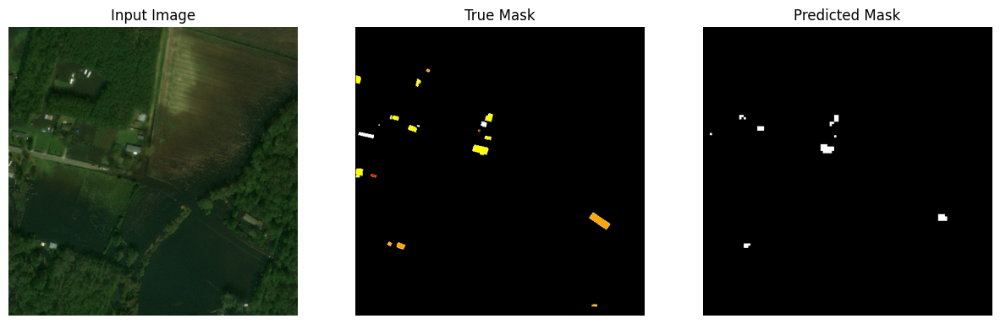

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 252014, 1: 10130}
label f1
0 0.9872486204360327
1 0.5894643535519817


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


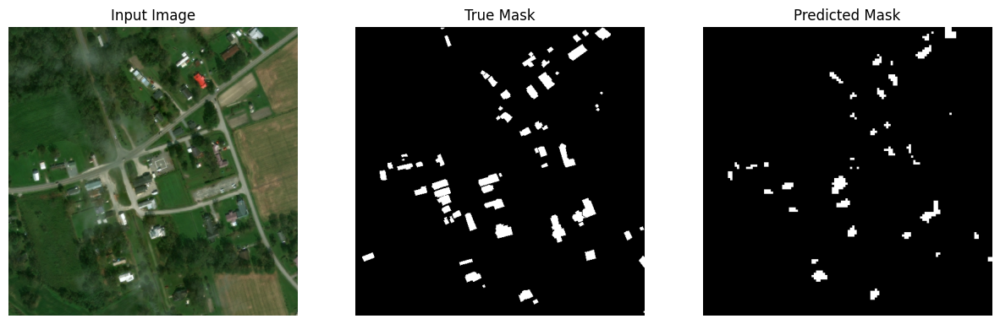

real classes:  [0 1 2 3]
predicted classes:  [0 1]
categories per pixel real image:  {0: 261221, 1: 101, 3: 794, 2: 28}
label f1
0 0.9985302128228897
1 0.01532567049808429
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


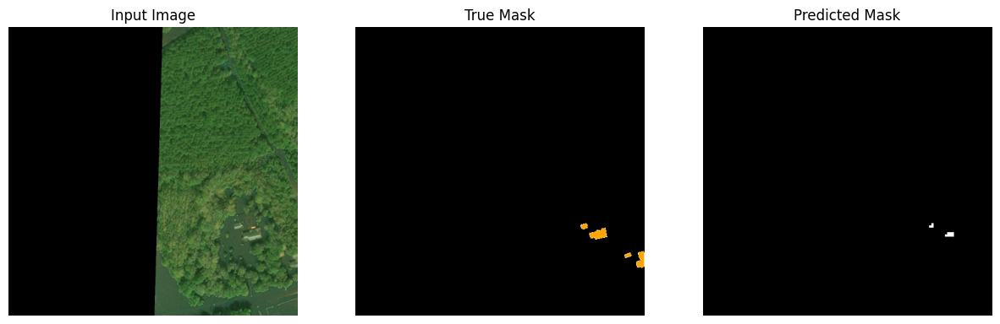

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 256550, 1: 5594}
label f1
0 0.9930254154637613
1 0.6245555323154153


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


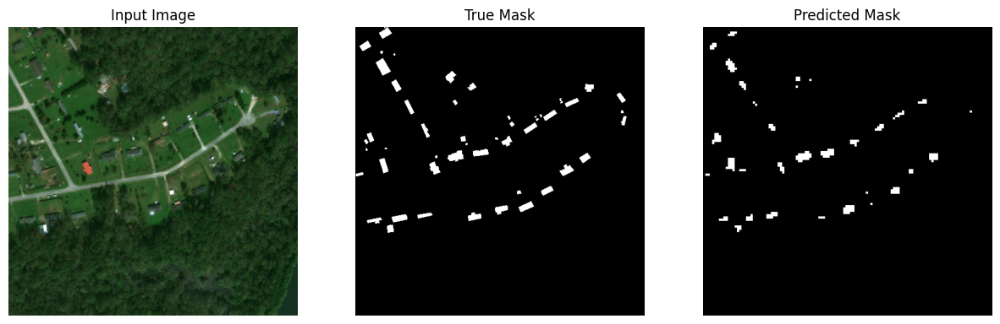

entering in loop for sample
1/1 [==============================] - 2s 2s/step
real classes:  [0 1]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 254760, 1: 7384}
label f1
0 0.994841611263199
1 0.7785129174543163
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


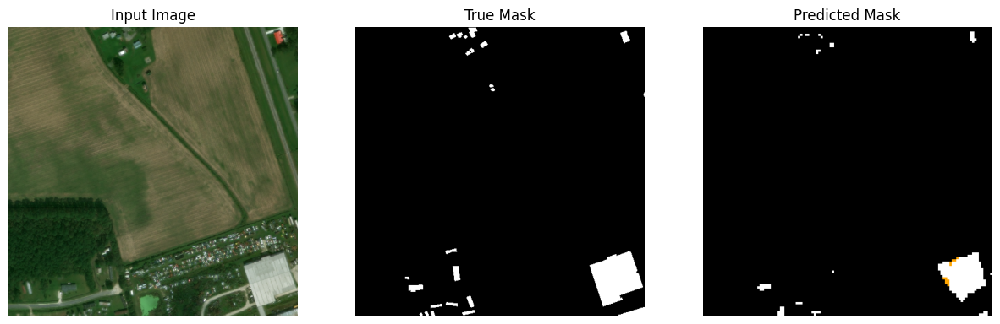

real classes:  [0 1 2 3]
predicted classes:  [0 1]
categories per pixel real image:  {0: 259150, 1: 578, 2: 1418, 3: 998}
label f1
0 0.9958719178846369
1 0.24182358771060455
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


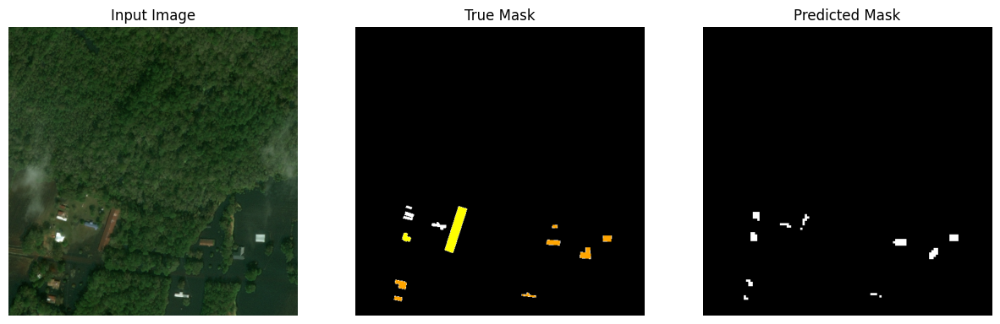

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 259425, 1: 2719}
label f1
0 0.99719458144655
1 0.6545110111295288


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


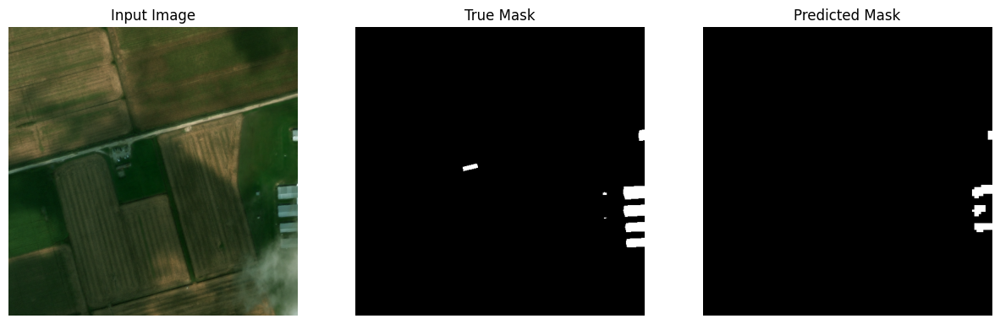

real classes:  [0 1 2 3]
predicted classes:  [0 1 2 3]
categories per pixel real image:  {0: 253085, 2: 5658, 3: 2955, 1: 446}
label f1
0 0.9875996612933823
1 0.03185924869234427
2 0.0
3 0.05074135090609555


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


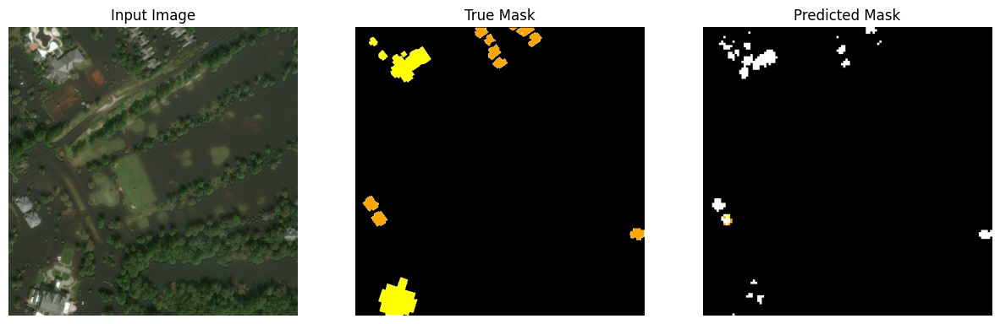

entering in loop for sample
1/1 [==============================] - 2s 2s/step
real classes:  [0 1 2]
predicted classes:  [0 1]
categories per pixel real image:  {0: 248585, 1: 13338, 2: 221}
label f1
0 0.9795953221158906
1 0.5094118794499171
2 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


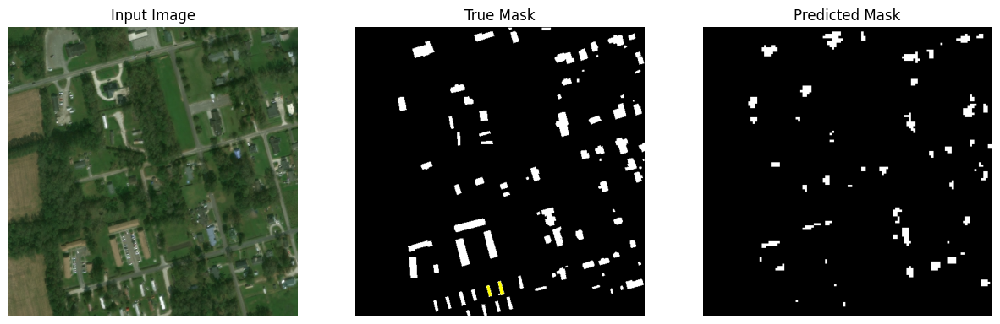

real classes:  [0 1 2 3]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 259996, 1: 448, 2: 96, 3: 1604}
label f1
0 0.9967292693962377
1 0.02868852459016393
2 0.0
3 0.0024691358024691358


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


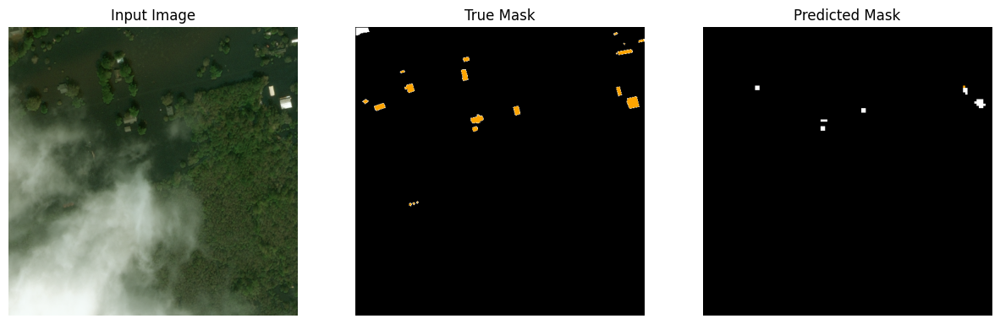

real classes:  [0 1 2 3]
predicted classes:  [0]
categories per pixel real image:  {0: 262065, 2: 8, 3: 68, 1: 3}
label f1
0 0.9998492967499604
1 0.0
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


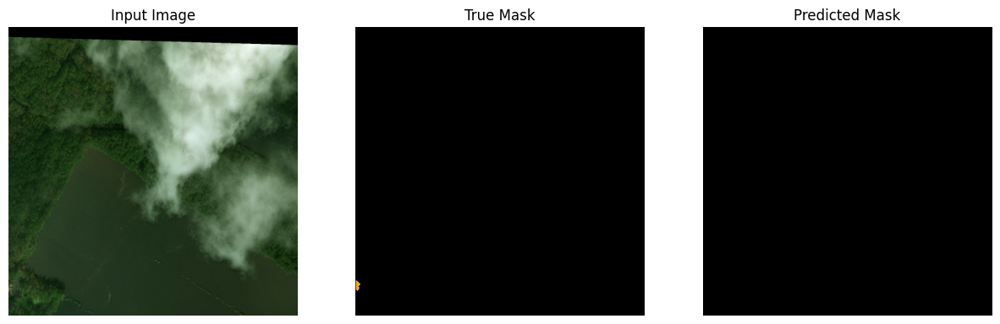

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 261221, 1: 923}
label f1
0 0.9986098070748772
1 0.45705750560119496


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


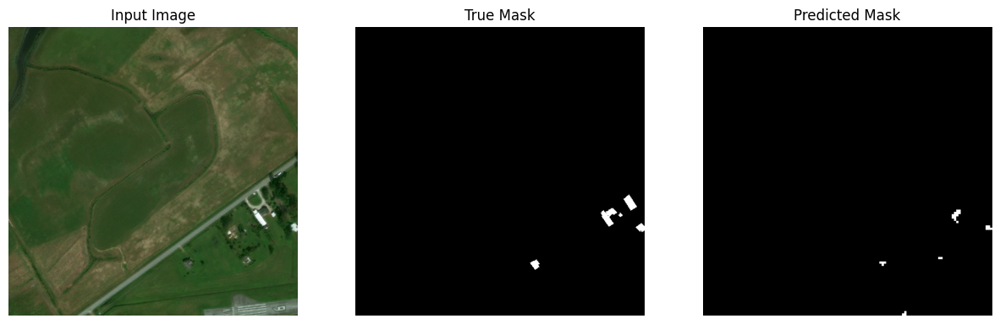

entering in loop for sample
1/1 [==============================] - 2s 2s/step
real classes:  [0 1 2 3]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 261178, 3: 812, 2: 105, 1: 49}
label f1
0 0.998753198275895
1 0.005194805194805194
2 0.0
3 0.08372093023255814


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


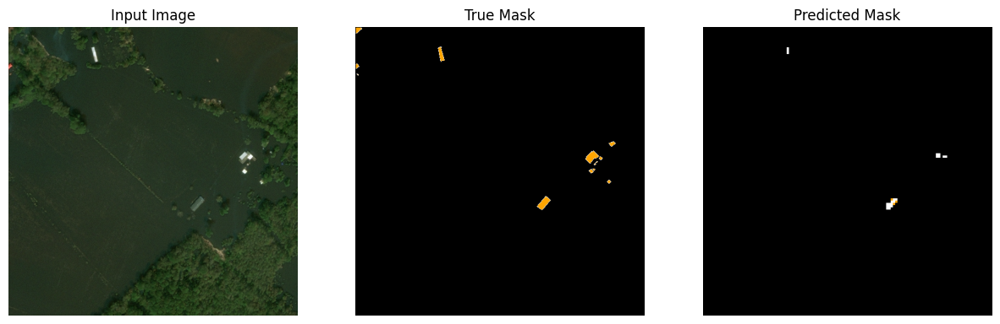

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 258084, 1: 4060}
label f1
0 0.9935965189751345
1 0.4295532646048109


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


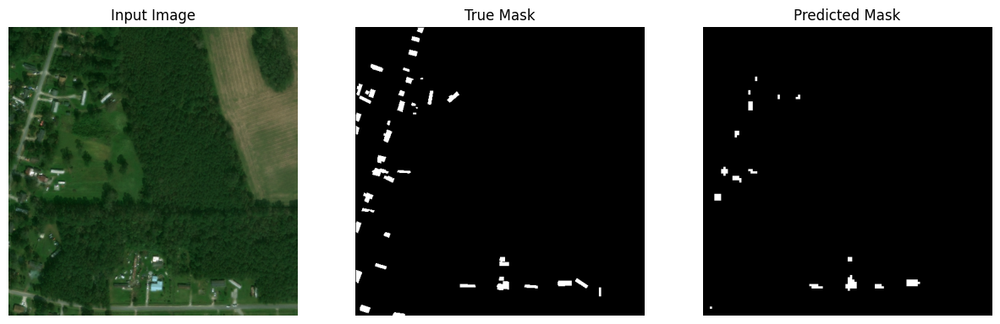

real classes:  [0 1 2]
predicted classes:  [0 1]
categories per pixel real image:  {0: 260734, 1: 1173, 2: 237}
label f1
0 0.9978447533333589
1 0.24174454828660435
2 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


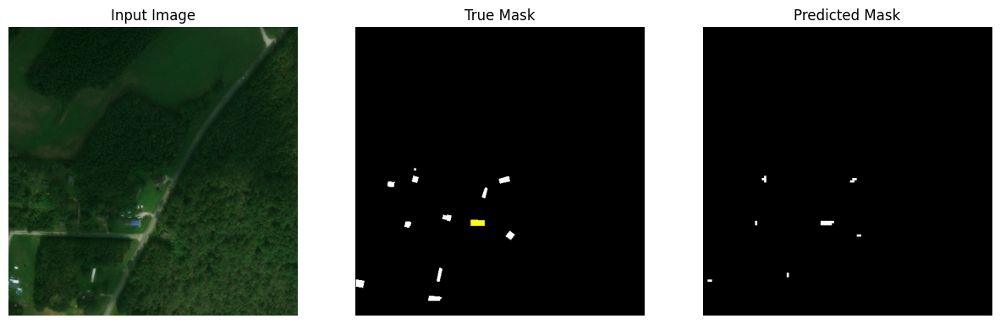

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 260980, 1: 1164}
label f1
0 0.9984104610811928
1 0.6092278719397363


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


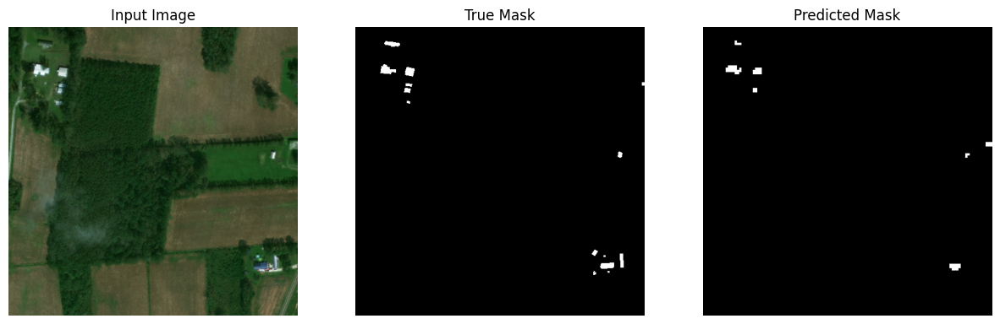

entering in loop for sample
1/1 [==============================] - 2s 2s/step
real classes:  [0 1 2 3]
predicted classes:  [0 3]
categories per pixel real image:  {0: 261751, 2: 25, 3: 332, 1: 36}
label f1
0 0.9993719348415805
1 0.0
2 0.0
3 0.31818181818181823


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


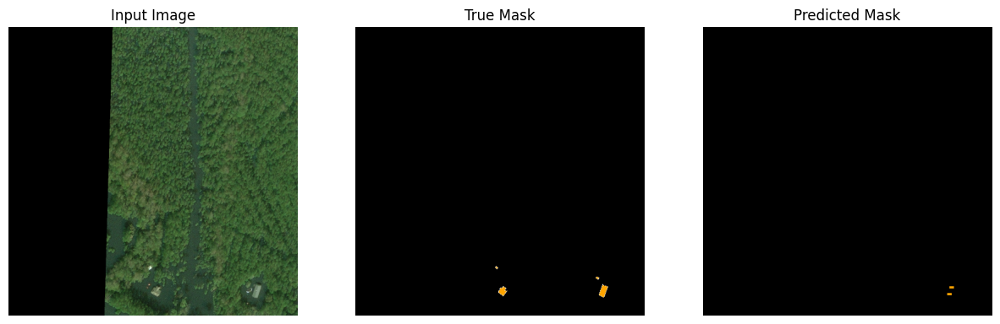

real classes:  [0 1]
predicted classes:  [0 1 2 3]
categories per pixel real image:  {0: 251082, 1: 11062}
label f1
0 0.9890156935652022
1 0.7188869636122719
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


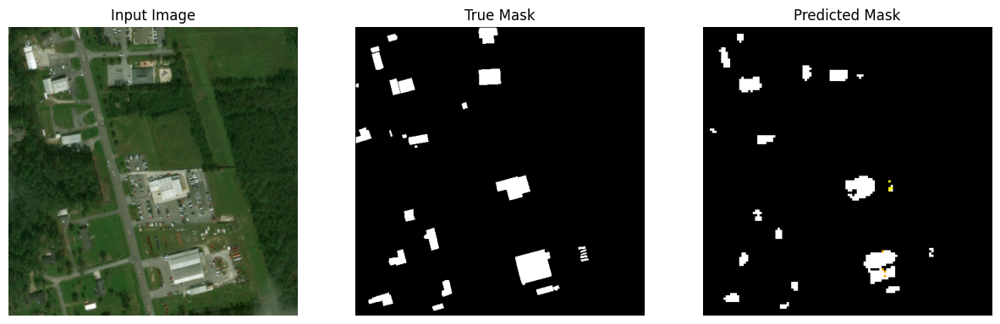

real classes:  [0 1]
predicted classes:  [0 1 2 3]
categories per pixel real image:  {0: 251756, 1: 10388}
label f1
0 0.9882374273708442
1 0.6139459995045826
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


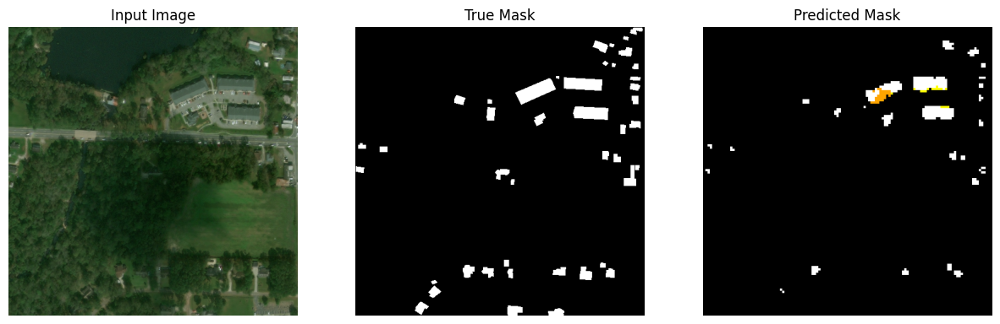

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 259233, 1: 2911}
label f1
0 0.9970364693354489
1 0.6906532663316582


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


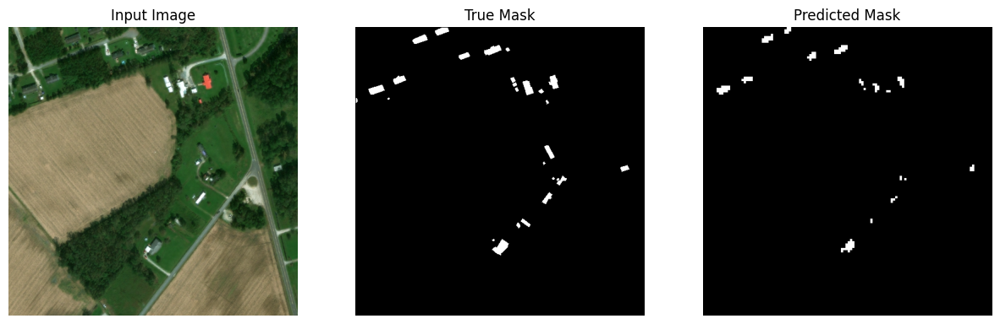

entering in loop for sample
1/1 [==============================] - 2s 2s/step
real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 259989, 1: 2155}
label f1
0 0.9970911311179849
1 0.5630227862705509


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


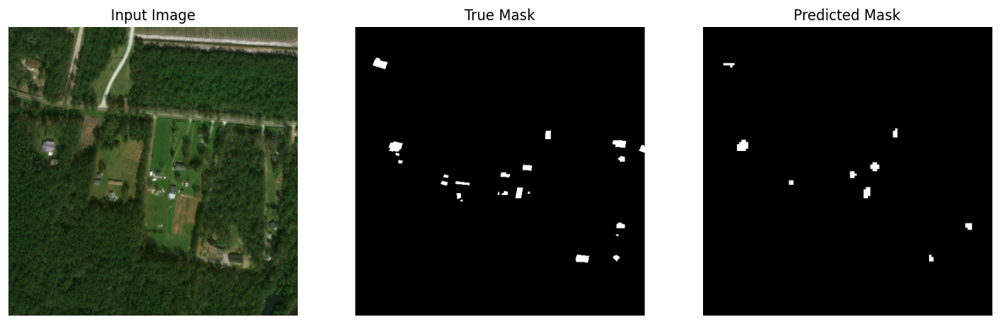

real classes:  [0 1 2 3]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 261785, 3: 310, 2: 42, 1: 7}
label f1
0 0.9996848889949868
1 0.0
2 0.0
3 0.018404907975460124


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


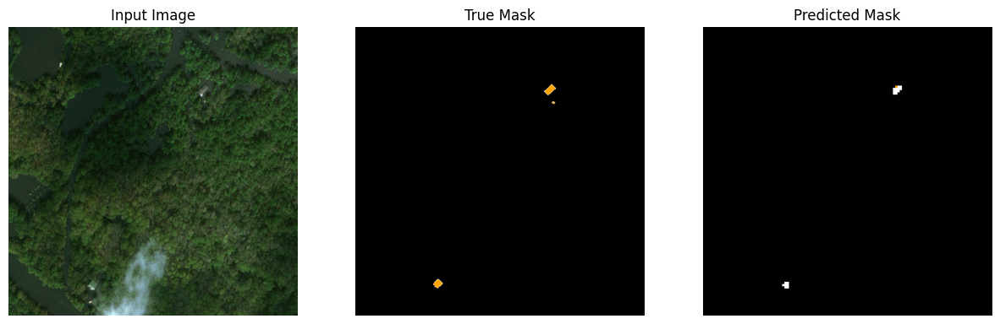

real classes:  [0 1 2 3 4]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 258363, 2: 196, 3: 3266, 1: 265, 4: 54}
label f1
0 0.9943725585702486
1 0.03330809992429977
2 0.0
3 0.015767131594906007
4 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


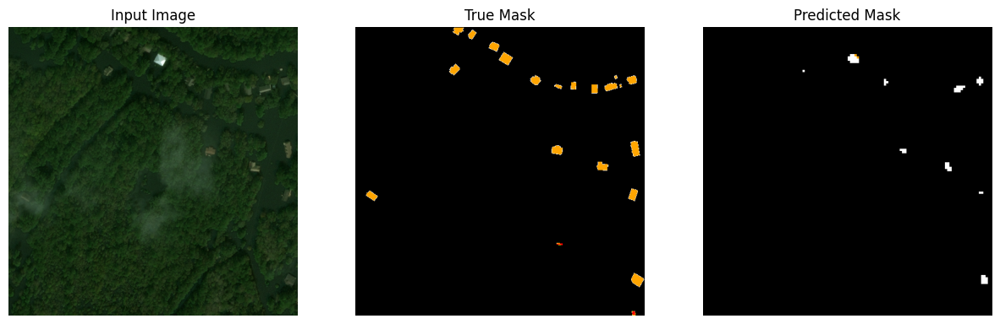

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 259578, 1: 2566}
label f1
0 0.9964395159894954
1 0.5520077406869859


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


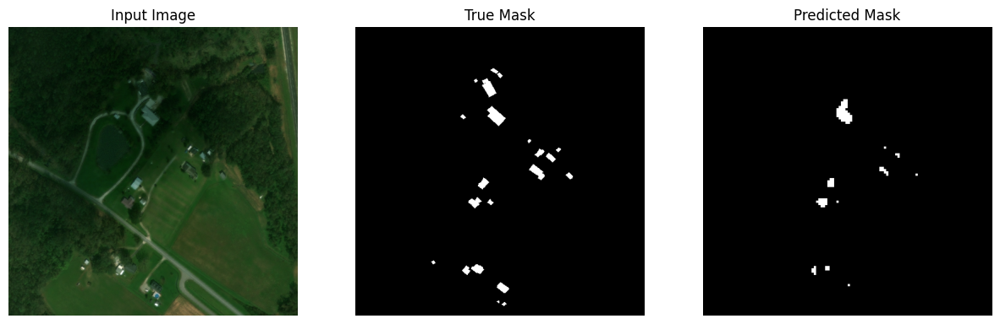

entering in loop for sample
1/1 [==============================] - 2s 2s/step
real classes:  [0 1 2 3 4]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 245644, 2: 401, 3: 15535, 1: 518, 4: 46}
label f1
0 0.9885598596956301
1 0.0
2 0.0
3 0.7974324954279772
4 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


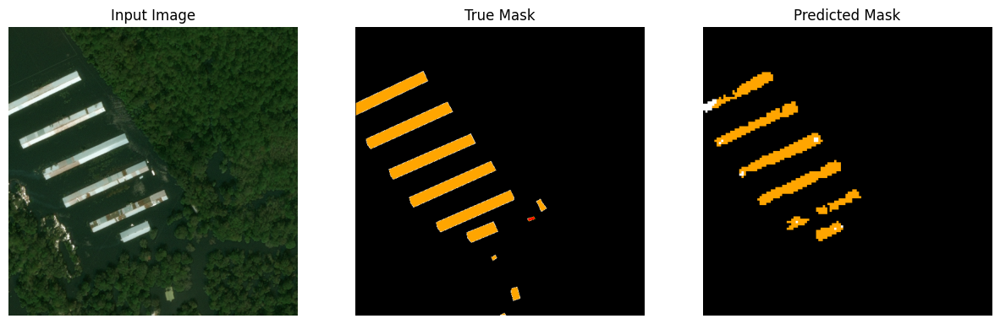

real classes:  [0 1 2 3]
predicted classes:  [0 1]
categories per pixel real image:  {0: 261350, 1: 315, 3: 461, 2: 18}
label f1
0 0.9990632658757316
1 0.5230769230769232
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


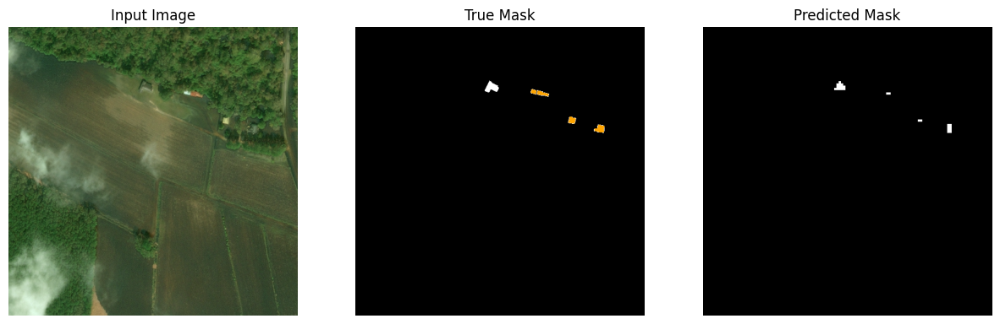

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 261186, 1: 958}
label f1
0 0.9986837725222208
1 0.5651074589127687


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


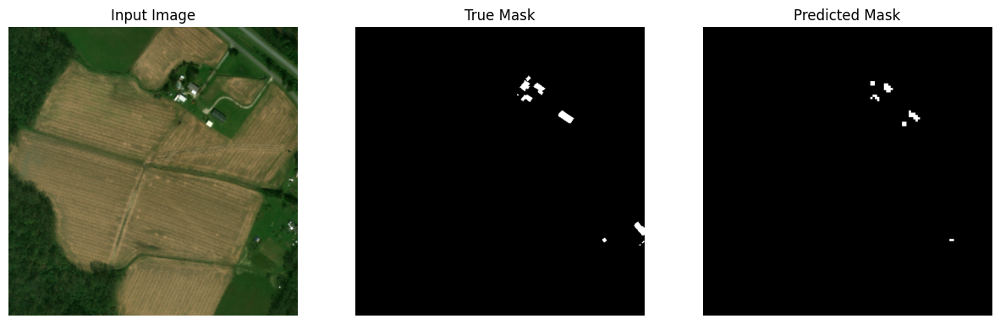

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 261785, 1: 359}
label f1
0 0.9995246141069332
1 0.5049701789264414


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


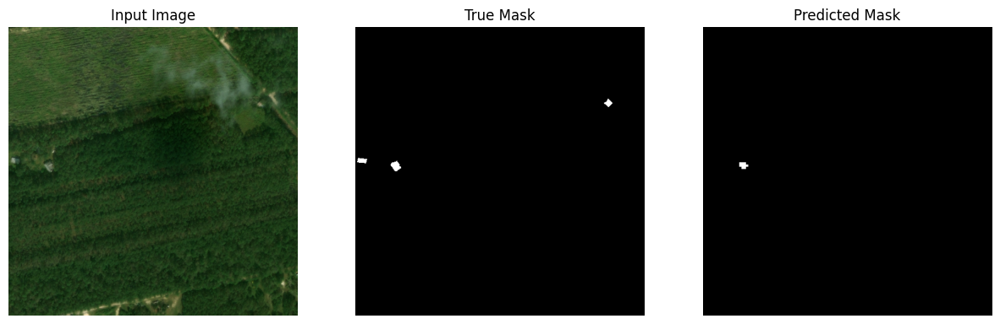

entering in loop for sample
1/1 [==============================] - 2s 2s/step
real classes:  [0 1 2 3]
predicted classes:  [0 1]
categories per pixel real image:  {0: 258303, 1: 751, 3: 1846, 2: 1244}
label f1
0 0.995026449108367
1 0.1295668549905838
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


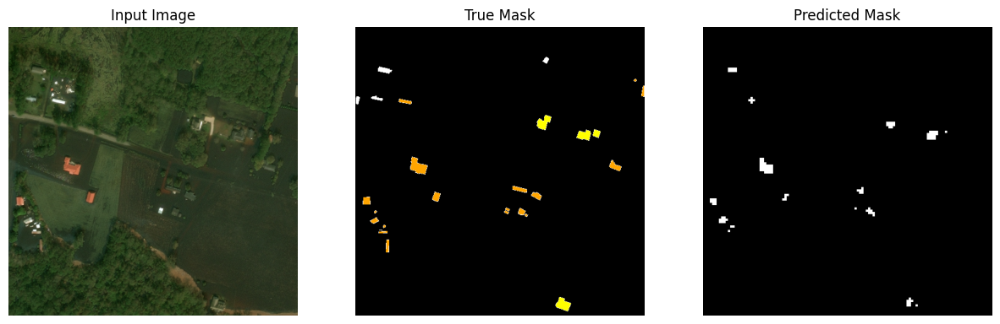

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 258118, 1: 4026}
label f1
0 0.9943659580379641
1 0.5141430948419302


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


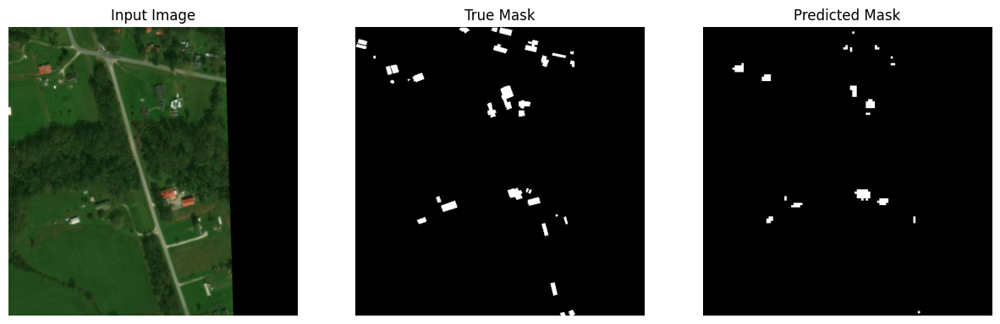

real classes:  [0 1 3]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 258941, 1: 2436, 3: 767}
label f1
0 0.9951389677670247
1 0.548180924287119
3 0.04086845466155811


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


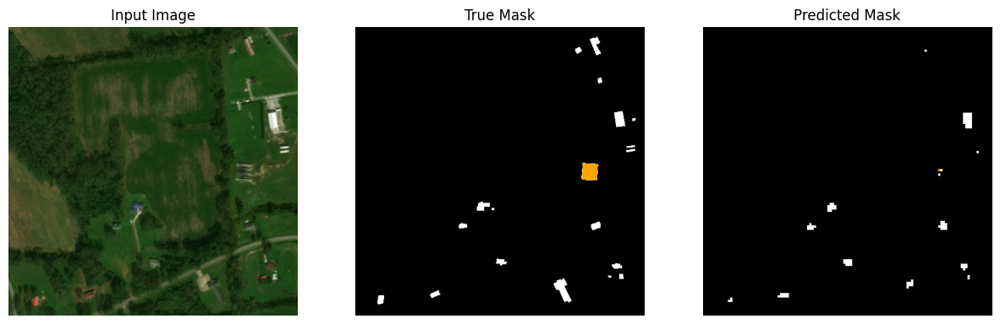

real classes:  [0 1 2 3]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 261958, 2: 19, 3: 148, 1: 19}
label f1
0 0.9997290355574043
1 0.0
2 0.0
3 0.17073170731707316


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


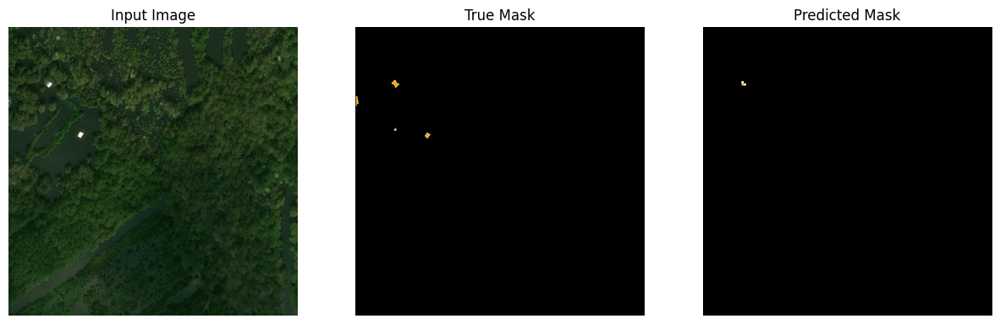

entering in loop for sample
1/1 [==============================] - 2s 2s/step
real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 239265, 1: 22879}
label f1
0 0.9601427051638112
1 0.26702170938274344


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


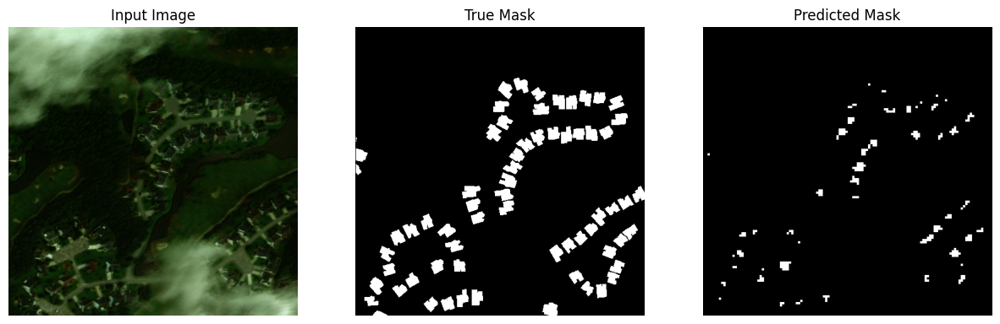

real classes:  [0 1 2 3]
predicted classes:  [0 1]
categories per pixel real image:  {0: 260796, 1: 47, 3: 1196, 2: 105}
label f1
0 0.9981279143664387
1 0.027826086956521737
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


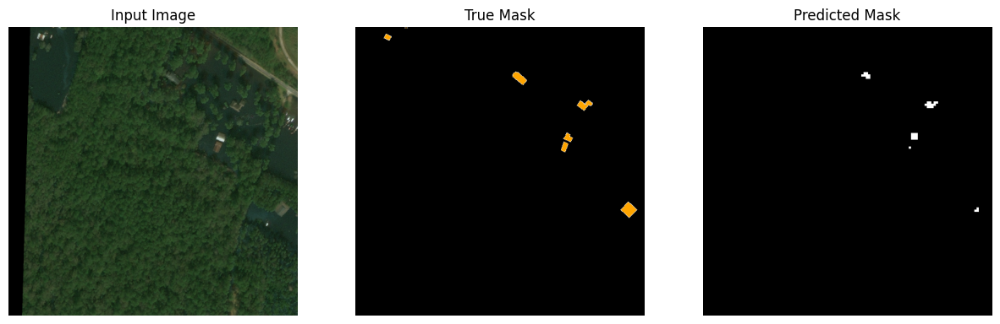

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 261273, 1: 871}
label f1
0 0.9987823643540509
1 0.44269466316710415


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


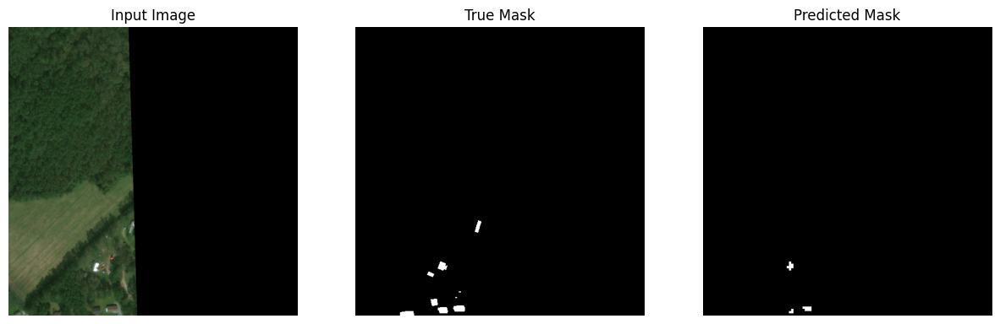

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 260564, 1: 1580}
label f1
0 0.9974475913080137
1 0.45140032948929165


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


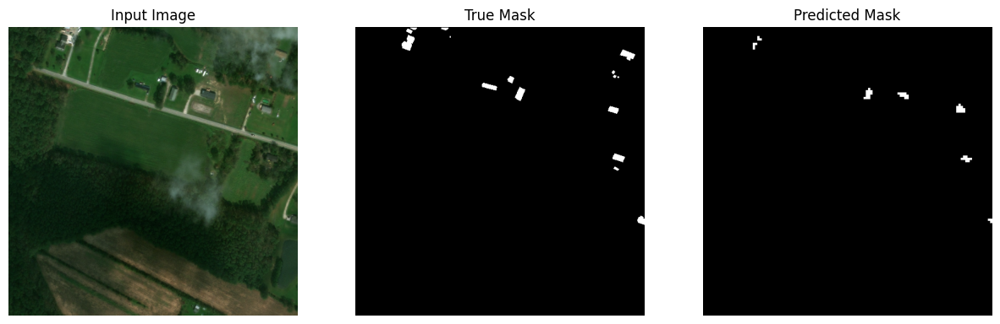

entering in loop for sample
1/1 [==============================] - 1s 1s/step
real classes:  [0 1 2 3]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 258875, 1: 3210, 2: 6, 3: 53}
label f1
0 0.9943043312055416
1 0.19769357495881382
2 0.0
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


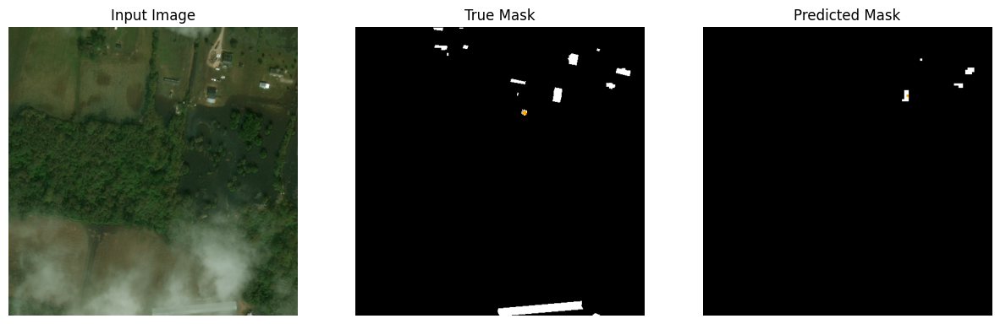

real classes:  [0 1]
predicted classes:  [0 1]
categories per pixel real image:  {0: 260783, 1: 1361}
label f1
0 0.9981475628094978
1 0.5745710514738231


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


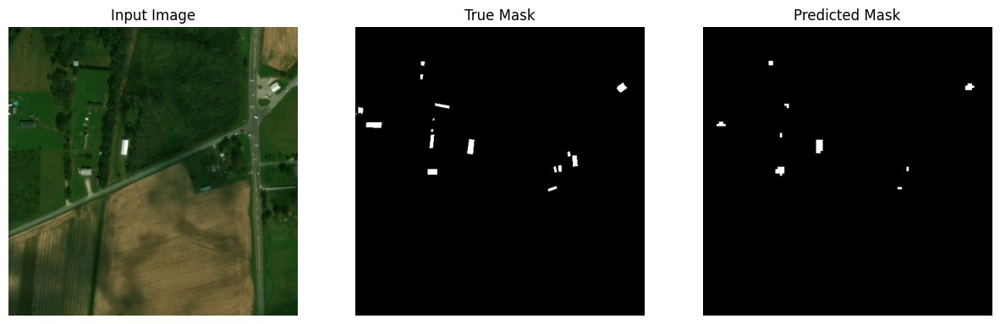

real classes:  [0 1]
predicted classes:  [0 1 3]
categories per pixel real image:  {0: 256052, 1: 6092}
label f1
0 0.9946062063651434
1 0.7150452934226074
3 0.0


/var/folders/hl/hfkbp3_54j7g9499gz2266zw0000gn/T/ipykernel_39495/3995128749.py:32: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of -1 to uint8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)`
will give the desired result (the cast overflows).
  deep_mask[y, x] = category


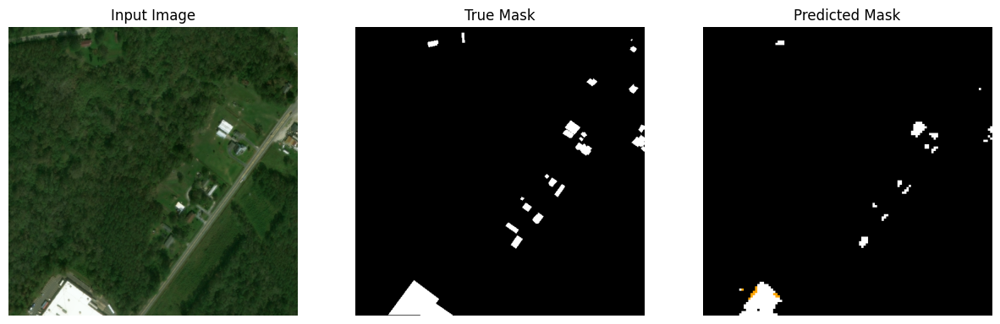

{0: 0.9945618873395988,
 1: 0.35913720875821464,
 2: 0.0,
 3: 0.03841840851538245,
 4: 0.0}

In [34]:
print(len(val))
calc_f1_score_per_class(val)